In [1]:
from PIL import Image
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pyzbar
import pyzbar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
!apt-get install libzbar0


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libv4l-0 libv4lconvert0
The following NEW packages will be installed:
  libv4l-0 libv4lconvert0 libzbar0
0 upgraded, 3 newly installed, 0 to remove and 34 not upgraded.
Need to get 238 kB of archives.
After this operation, 817 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 libv4lconvert0 amd64 1.18.0-2build1 [76.5 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/main amd64 libv4l-0 amd64 1.18.0-2build1 [41.9 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 libzbar0 amd64 0.23-1.3 [119 kB]
Fetched 238 kB in 1s (398 kB/s)
Selecting previously unselected package libv4lconvert0:amd64.
(Reading database ... 122545 files and directories currently installed.)
Preparing to unpack .../libv4lconvert0_1.18.0-2build1_amd64.deb ...
Unpacking libv4lconvert0:amd64 (1.18.0-2build1) ...
Se

In [5]:
!apt-get install libzbar0

import cv2
import numpy as np
import pyzbar.pyzbar as pyzbar

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libzbar0 is already the newest version (0.23-1.3).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


Number of barcodes: 11


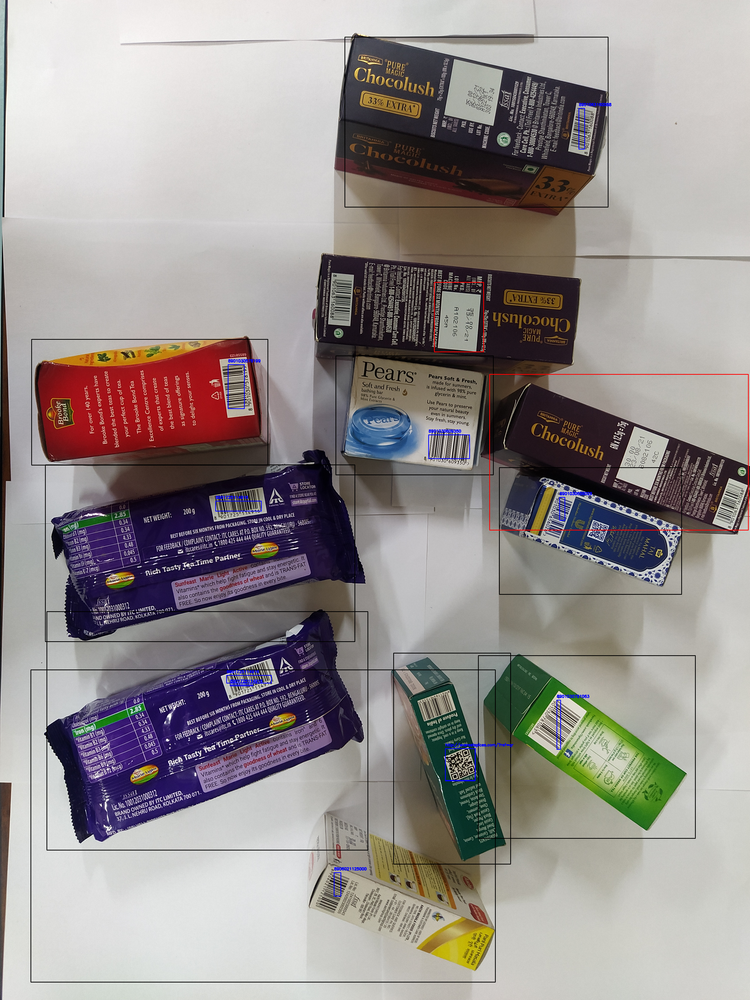

In [7]:
import torch
import torchvision
import torchvision.transforms as T
import numpy as np
import cv2
from pyzbar import pyzbar

# Load the pre-trained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Load the image
image = cv2.imread('/content/drive/My Drive/Mowtio Project/sample/all barcode/IMG_20220303_173846.jpg')

# Preprocess the input
transform = T.Compose([T.ToTensor()])
input_tensor = transform(image)
input_tensor = input_tensor.unsqueeze(0)

# Forward pass through the model
with torch.no_grad():
    predictions = model(input_tensor)

# Extract bounding box coordinates, labels, and scores
boxes = predictions[0]['boxes'].detach().numpy()
labels = predictions[0]['labels'].detach().numpy()
scores = predictions[0]['scores'].detach().numpy()

# Apply Non-Maximum Suppression (NMS)
confidence_threshold = 0.12
nms_threshold = 0.6
indices = cv2.dnn.NMSBoxes(boxes, scores, confidence_threshold, nms_threshold)

count = 0
no_barcode_boxes = []

# Loop over the filtered bounding boxes
for i in indices.flatten():
    box = boxes[i]
    label = labels[i]
    score = scores[i]

    x, y, w, h = box.astype(int)

    # Draw bounding box on the image for barcodes
    cv2.rectangle(image, (x, y), (w, h), (0, 0, 0), 2)

    # Crop the region of interest for barcode detection
    roi = image[y:h, x:w]

    scale = 4
    width = int(roi.shape[1] * scale)
    height = int(roi.shape[0] * scale)
    roi = cv2.resize(roi, (width, height))

    # Convert the region of interest to grayscale
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    ret, bw_im = cv2.threshold(gray, 107, 255, cv2.THRESH_BINARY)

    # Decode barcodes
    barcodes = pyzbar.decode(bw_im)

    if len(barcodes) == 0:
        no_barcode_boxes.append(box)

    count += len(barcodes)

    # Loop over the detected barcodes
    for barcode in barcodes:
        # Extract barcode data and bounding box coordinates
        barcode_data = barcode.data.decode("utf-8")
        (x_bar, y_bar, w_bar, h_bar) = barcode.rect

        # Scale the barcode bounding box coordinates to the original image size
        x_bar_orig = x + int(x_bar / 4)
        y_bar_orig = y + int(y_bar / 4)
        w_bar_orig = int(w_bar / 4)
        h_bar_orig = int(h_bar / 4)

        # Draw bounding box around barcode in the original image
        cv2.rectangle(image, (x_bar_orig, y_bar_orig), (x_bar_orig + w_bar_orig, y_bar_orig + h_bar_orig), (255, 0, 0), 2)

        # Display barcode data as text
        cv2.putText(image, barcode_data, (x_bar_orig, y_bar_orig - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0, 0), 2)

# Draw bounding boxes of red color for items without barcodes
for box in no_barcode_boxes:
    x, y, w, h = box.astype(int)
    cv2.rectangle(image, (x, y), (w, h), (0, 0, 255), 2)

print("Number of barcodes:", count)

# Display the image with bounding boxes and barcode data
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()
